In [1]:
import MILWRM as mw
import scanpy as sc

---
### Read in Visium ST Anndata
This uses standard `scanpy` functions

In [3]:
a1 = sc.read("data/V1_Breast_Cancer_Block_A_Section_1_raw.h5ad"); a1

AnnData object with n_obs × n_vars = 4992 × 25062
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

In [4]:
a2 = sc.read("data/V1_Breast_Cancer_Block_A_Section_2_raw.h5ad"); a2

AnnData object with n_obs × n_vars = 4992 × 25149
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

---
### Map ST data to histology pixels and trim images
This uses functions from `st_utils.py`

In [5]:
a1 = mw.map_pixels(a1, filter_label="in_tissue")

Creating pixel grid and mapping to nearest barcode coordinates
Saving barcode mapping to adata.uns['pixel_map_df'] and adding metadata
Filtering barcodes using labels in self.adata.obs['in_tissue']
New size: 3798 spots x 25062 genes
Done!


Cropping image to pixel dimensions and adding values to adata.uns['pixel_map_df']
Cropping Visium spot coordinates and saving to adata.obsm['spatial_trim']
Saving cropped and trimmed image to adata.uns['spatial']['V1_Breast_Cancer_Block_A_Section_1']['images']['hires_trim']
Plotting pita as RGB image
Done!


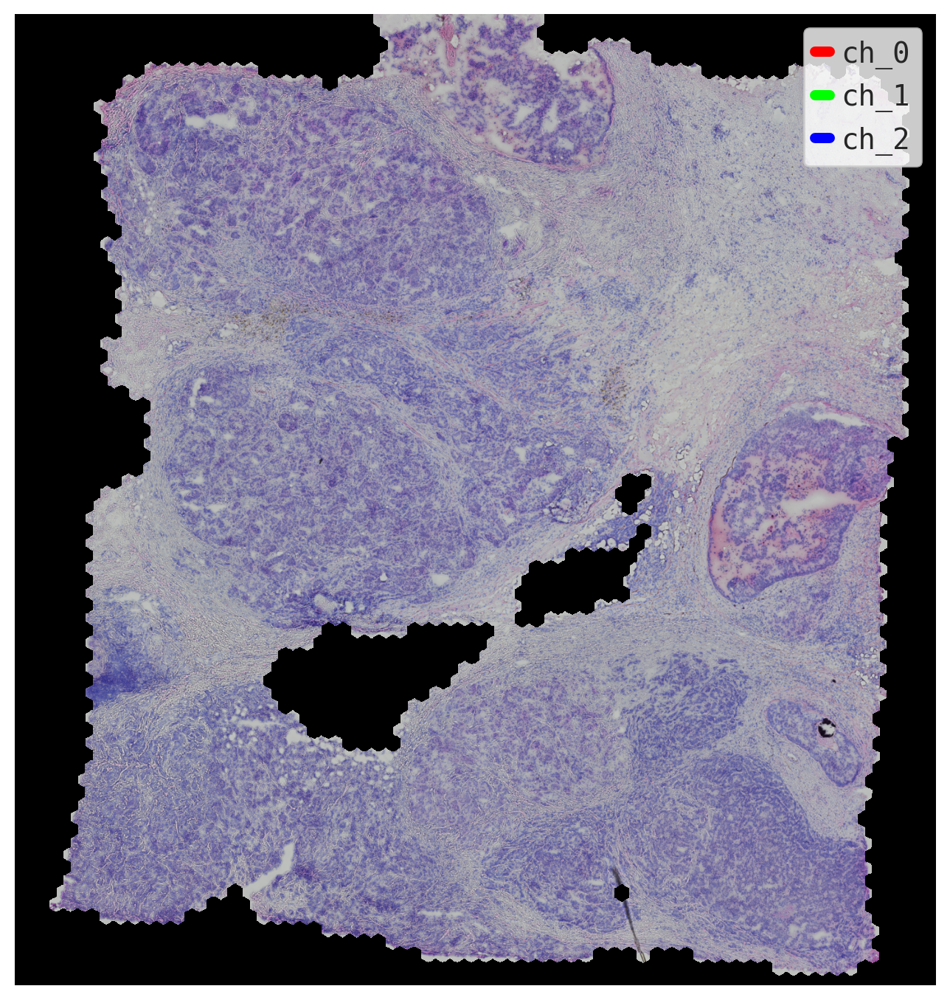

In [6]:
a1_image = mw.trim_image(a1)

In [7]:
a2 = mw.map_pixels(a2, filter_label="in_tissue")

Creating pixel grid and mapping to nearest barcode coordinates
Saving barcode mapping to adata.uns['pixel_map_df'] and adding metadata
Filtering barcodes using labels in self.adata.obs['in_tissue']
New size: 3987 spots x 25149 genes
Done!


Cropping image to pixel dimensions and adding values to adata.uns['pixel_map_df']
Cropping Visium spot coordinates and saving to adata.obsm['spatial_trim']
Saving cropped and trimmed image to adata.uns['spatial']['V1_Breast_Cancer_Block_A_Section_2']['images']['hires_trim']
Plotting pita as RGB image
Done!


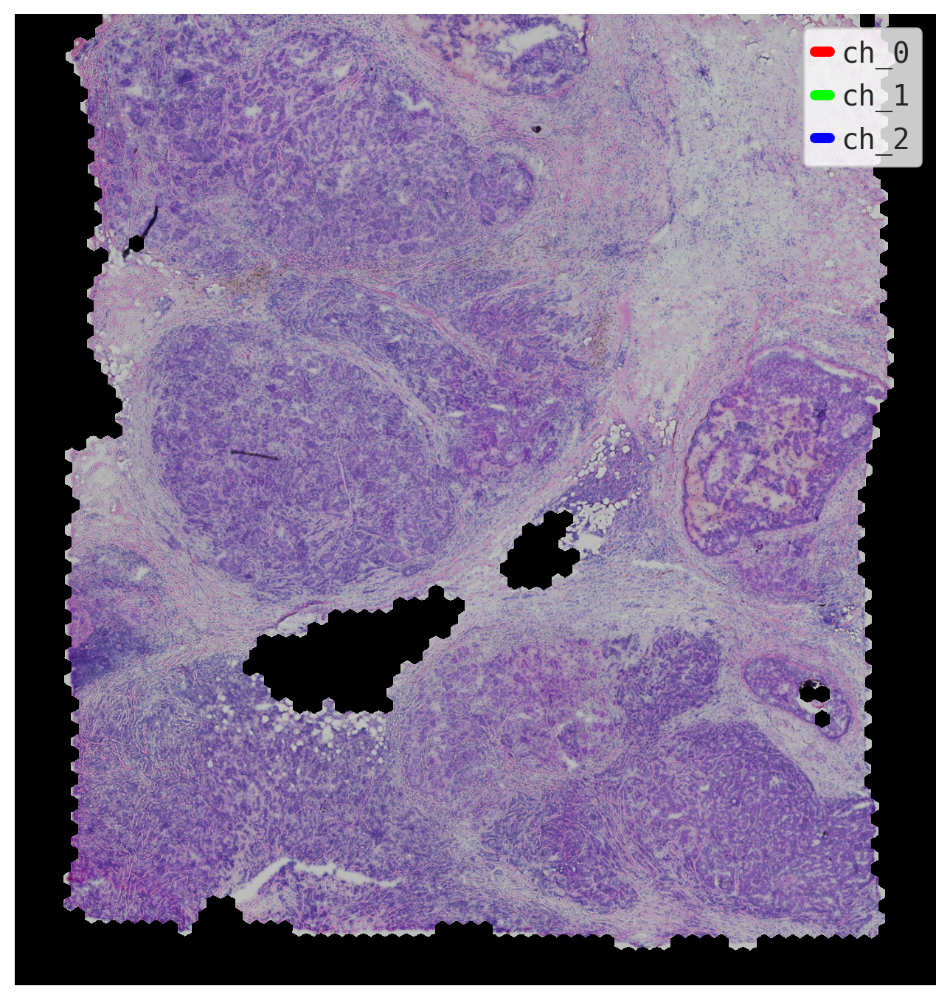

In [8]:
a2_image = mw.trim_image(a2)

---
### Perform joint PCA to get a low-dimensional space for clustering
Again, standard `scanpy`/`anndata` functions here

In [9]:
a_comb = a1.concatenate([a2], fill_value=0, join="outer"); a_comb

AnnData object with n_obs × n_vars = 7785 × 26384
    obs: 'in_tissue', 'array_row', 'array_col', 'batch'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1'
    obsm: 'spatial', 'spatial_trim', 'image_means'

In [10]:
sc.pp.normalize_total(a_comb)
sc.pp.log1p(a_comb)
sc.pp.scale(a_comb)
sc.pp.pca(a_comb, n_comps=50)

/Users/cody/.virtualenvs/milwrm/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'gene_ids-0' as categorical
/Users/cody/.virtualenvs/milwrm/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'gene_ids-1' as categorical


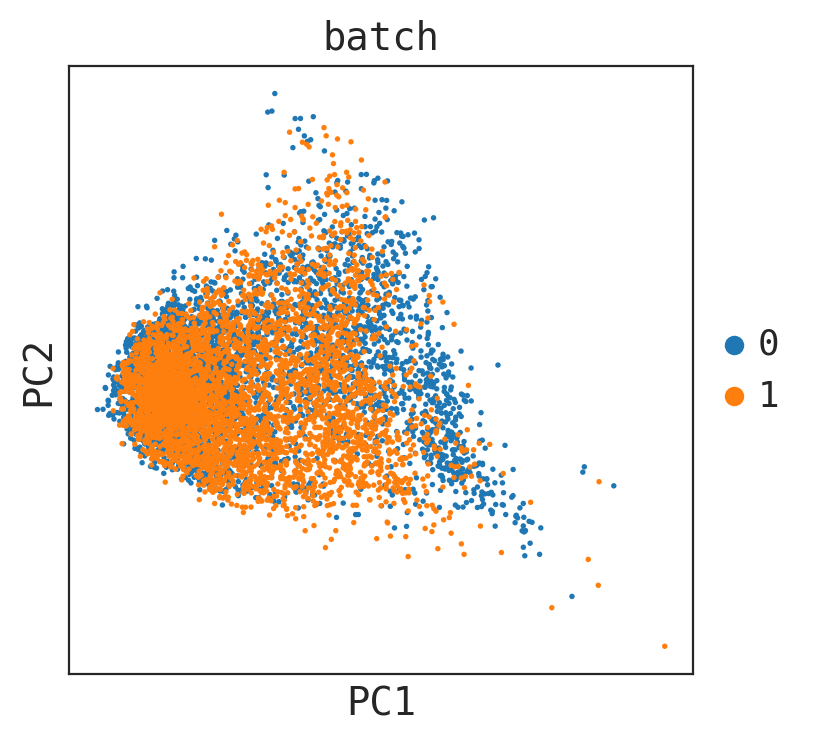

/Users/cody/.virtualenvs/milwrm/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/cody/.virtualenvs/milwrm/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:203: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0, flags=flags)


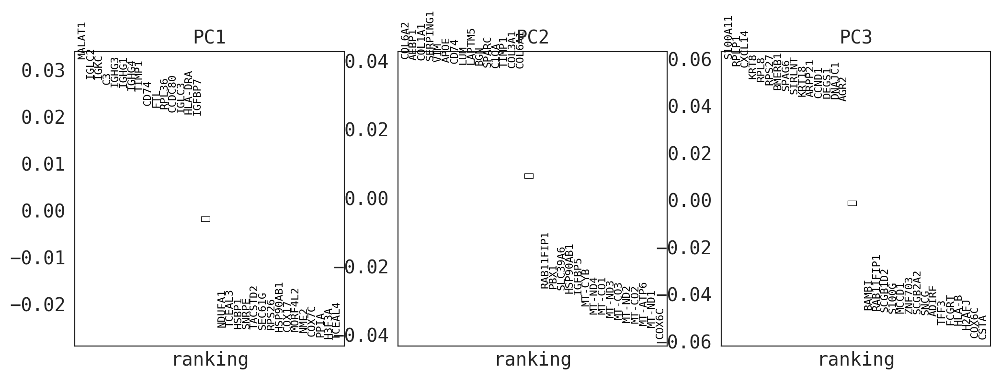

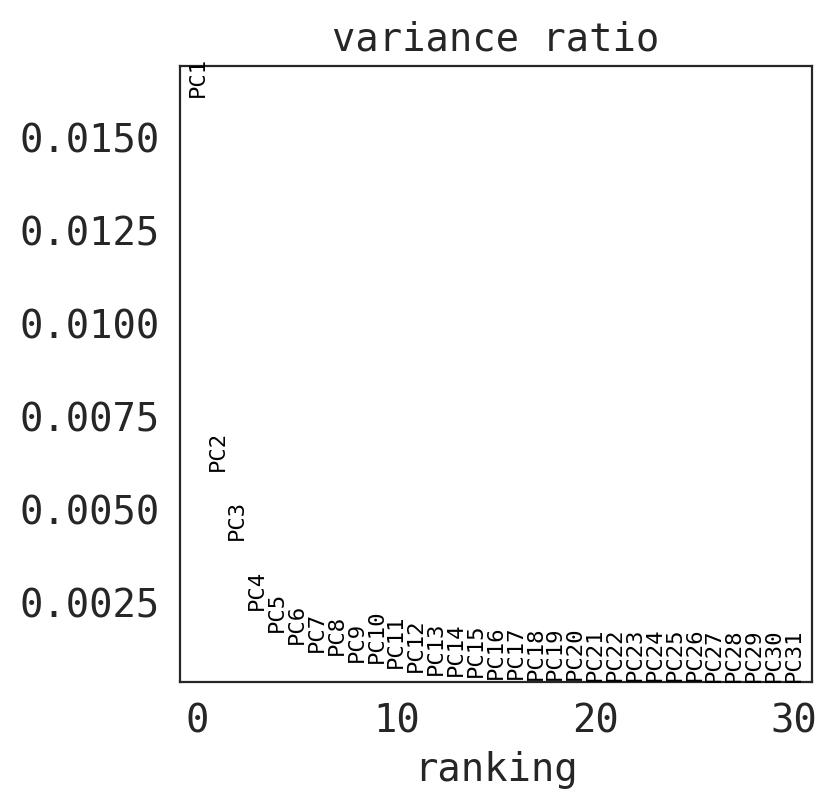

In [11]:
sc.pl.pca_overview(a_comb, color="batch")

In [12]:
# add PCA coordinates to original anndata objects
a1.obsm["X_pca"] = a_comb[a_comb.obs.batch=="0",:].obsm["X_pca"]
a2.obsm["X_pca"] = a_comb[a_comb.obs.batch=="1",:].obsm["X_pca"]

---
### Create `st_labeler` object and define macro clusters based on transcriptomics and histology
This comes from `H2TL.py`

In [13]:
tl = mw.st_labeler([a1, a2])

Initiating ST labeler with 2 anndata objects


#### Since we have brightfield histology for both sections, we can set `histo=True` to include imaging features (R, G, B channels) in the clustering model

In [14]:
%time tl.prep_cluster_data(use_rep="X_pca", features=[0,1,2,3,4,5,6], blur_pix=2, histo=True)

Adding mean RGB histology features for adata #0
Blurring training features for adata #0
Adding mean RGB histology features for adata #1
Blurring training features for adata #1
Collected clustering data of shape: (7785, 10)
CPU times: user 48.1 s, sys: 46.6 ms, total: 48.1 s
Wall time: 48.1 s


#### We'll determine the optimal number of tissue regions by scaled inertia
If we want more clusters here, we can make the `alpha` penalty value smaller. If we want fewer clusters, we'll make it larger. The default value is `alpha=0.05`.

Determining optimal cluster number k via scaled inertia


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of  19 | elapsed:    3.3s remaining:   28.4s
[Parallel(n_jobs=-1)]: Done   4 out of  19 | elapsed:    3.5s remaining:   13.1s
[Parallel(n_jobs=-1)]: Done   6 out of  19 | elapsed:    3.6s remaining:    7.9s
[Parallel(n_jobs=-1)]: Done   8 out of  19 | elapsed:    3.7s remaining:    5.0s
[Parallel(n_jobs=-1)]: Done  10 out of  19 | elapsed:    3.8s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done  12 out of  19 | elapsed:    3.9s remaining:    2.2s
[Parallel(n_jobs=-1)]: Done  14 out of  19 | elapsed:    4.0s remaining:    1.4s
[Parallel(n_jobs=-1)]: Done  16 out of  19 | elapsed:    4.2s remaining:    0.8s
[Parallel(n_jobs=-1)]: Done  19 out of  19 | elapsed:    4.3s finished


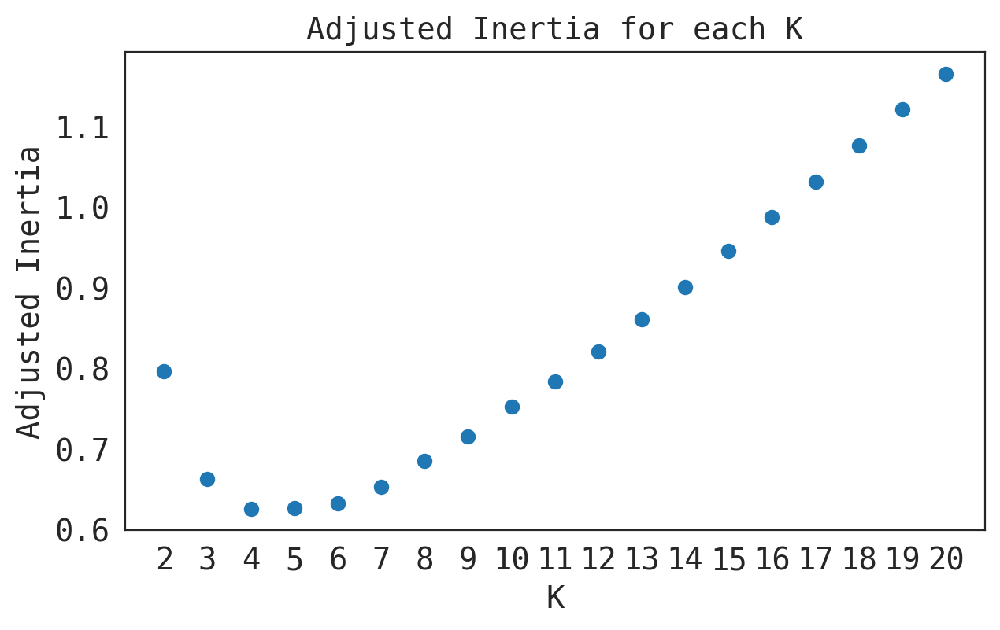

The optimal number of clusters is 4
Performing k-means clustering with 4 target clusters
Adding tissue_ID label to anndata objects
CPU times: user 1.81 s, sys: 788 ms, total: 2.6 s
Wall time: 4.77 s


In [15]:
%time tl.label_tissue_regions(plot_out=True, alpha=0.05)

#### Now show the features used for clustering after spatial blurring along with the final `tissue_ID` in each section

Assembling pita with 11 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!
Assembling pita with 11 features from adata.obs
Casting barcodes to pixel dimensions and saving to adata.uns['pixel_map']
Done!


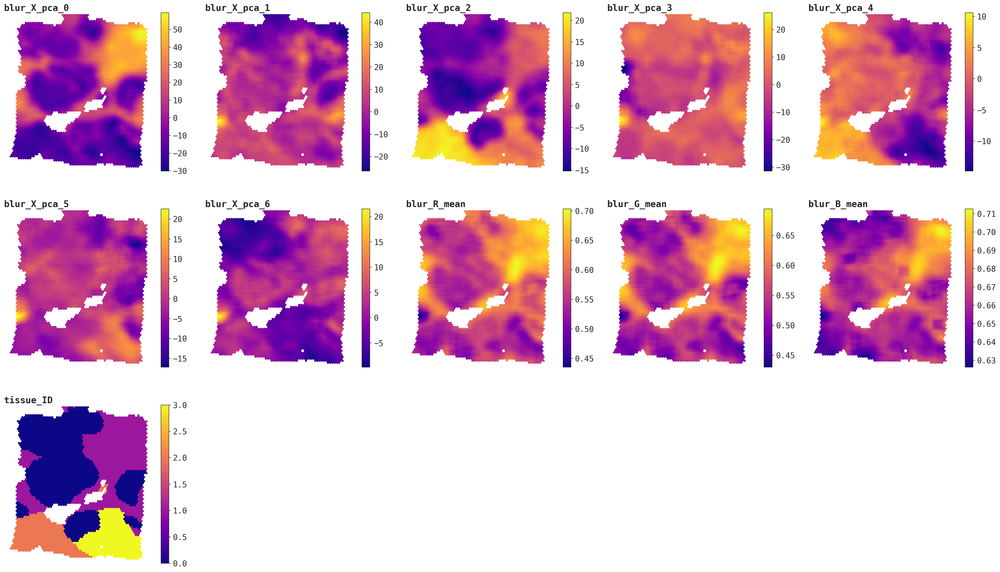

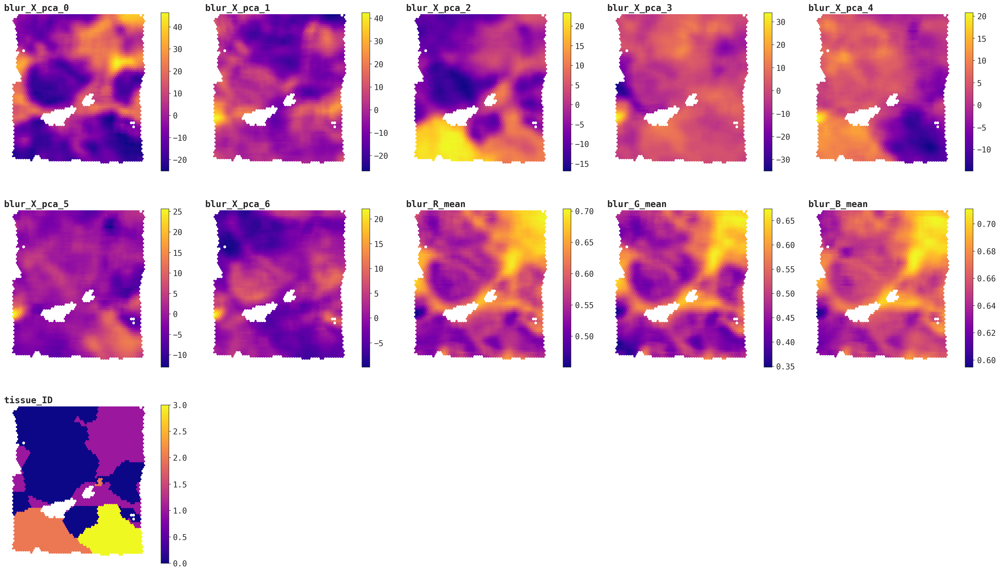

In [16]:
for i in range(len(tl.adatas)):
    # get blurred features that are saved to adata.obs
    n = list(tl.adatas[i].obs.columns[tl.adatas[i].obs.columns.str.startswith("blur_")]) + ["tissue_ID"]
    # create plot of blurred training features and final tissue_ID labels
    p = mw.assemble_pita(tl.adatas[i], use_rep=".obs", features=n, ncols=5, label=n, cmap="plasma")

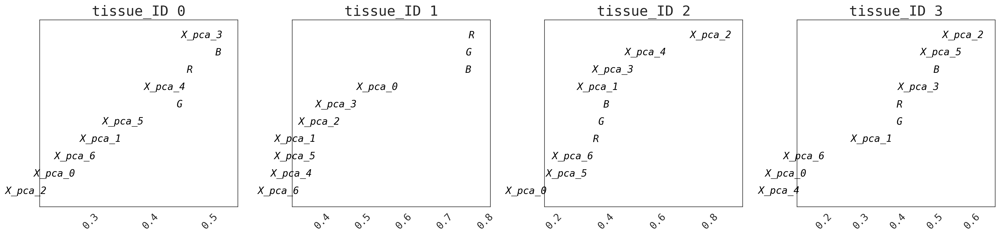

In [17]:
fl = tl.plot_feature_loadings()

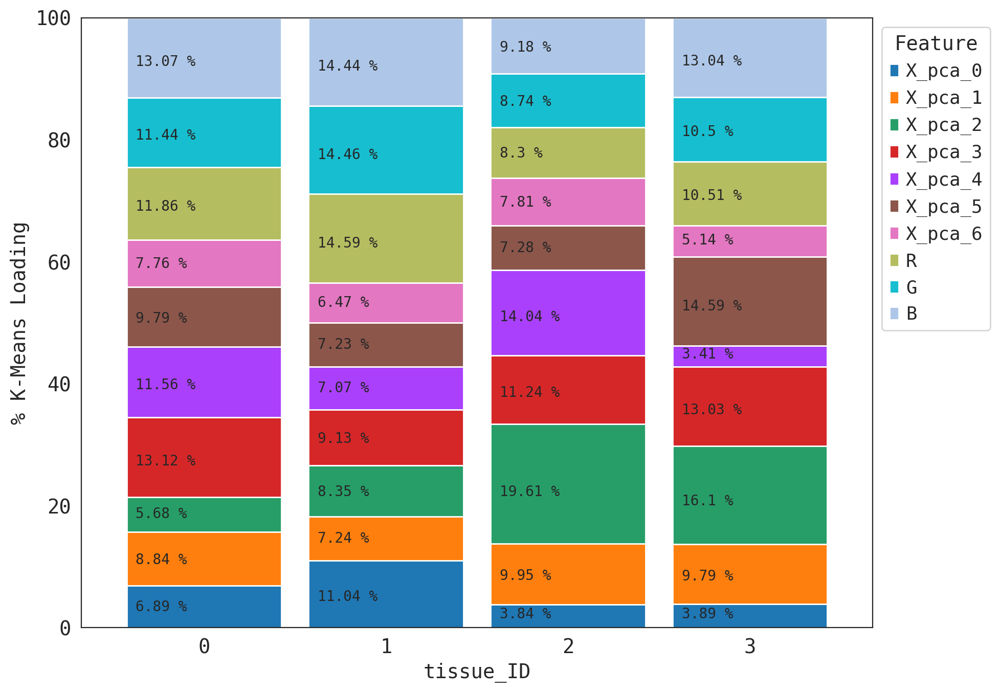

In [18]:
fp = tl.plot_feature_proportions()